In [0]:
!apt-get install -y -qq software-properties-common python-software-properties module-init-tools
!add-apt-repository -y ppa:alessandro-strada/ppa 2>&1 > /dev/null
!apt-get update -qq 2>&1 > /dev/null
!apt-get -y install -qq google-drive-ocamlfuse fuse
from google.colab import auth
auth.authenticate_user()
from oauth2client.client import GoogleCredentials
creds = GoogleCredentials.get_application_default()
import getpass
!google-drive-ocamlfuse -headless -id={creds.client_id} -secret={creds.client_secret} < /dev/null 2>&1 | grep URL
vcode = getpass.getpass()
!echo {vcode} | google-drive-ocamlfuse -headless -id={creds.client_id} -secret={creds.client_secret}



In [0]:
!mkdir results
!pip install keras

import keras
keras.__version__

In [0]:
!pip3 install imageio


In [0]:
!wget -O draw_2.jpg https://proxygen.odrive.com/securedownload?options=TBmOxQGWhyyWoMYJWV%2B9lMbVnDvoZ7cHW4HOKeqlWTlryqG8680ydTfcH9PJNM2M39CMHuUxs2IvqBRkmp0ZDreFm2U0icmM8MyjmIcoKcnVupCFwQbIrUbVgPgdlkel8Ah8GU1%2Frc2OVQjSivuq%2FDa1d3QuV63sMHArksU%2Fg0B%2FYa4qyqZF3IEFdsGA6VRp5je77jDeF5ORQuO6vBVW52vDFjXwCI08byGpY8z1vvNYC9xBnnPhBlbXZJOuAyGq7z%2Fz%2BRaSpucQlUihaLaGovCtqcnC0VmGbNb4Cb830vmOc5esRLfcVLbb2C9%2Fe%2BDcWu%2FWrOSfj0feJ2c0MImsrnsVD9w7VtWZSXNFmCtZI1A2RVuBu9SfSyJYnqaAncfo

!wget -O draw_1.jpg https://proxygen.odrive.com/securedownload?options=PwvvM3ERoyq3ntNgRvY3gxUdL1dvPWDmrbofrv8TmQjqe78pyOx3thmDa24qCJlOn%2BkAhzDu4uiVIoJGVdwg%2BQXVrjQ%2FjklNcy6BsJXkGpq6%2FywU4eTaP2FFo5c40Y7RQd0M%2BBfj6D8uFoCfNp6AZzI1QtzSbN06BKxR12UVB09r9R0RLI7Ak0dwJz7c6SY4k60rHhX90bG2sy5sQr9voLaAD3BQrcDYsgPL3IS2A1jqinrgYi%2F12Vk2%2BUKfJjV4cChxBOYMyUEYwuLdtSIH1VHuc32USpiXIG9rWh%2Be7a2XxW%2BbQUt6riJQgnOttBZ07knI%2B0EkGOK5PkjDNsUQhbuHi%2BaUtRJiyLuDOlbQjkvw7Rnrtr5ye%2BZJTz3YfkK0
  


In [1]:
# Create a directory and mount Google Drive using that directory.
!mkdir -p drive
!google-drive-ocamlfuse drive

import os
print(os.getcwd())

# local 
# os.chdir("./Artistic/dataset/")
os.chdir('./drive/gpu/Artistic/dataset')

print(os.getcwd())


fuse: mountpoint is not empty
fuse: if you are sure this is safe, use the 'nonempty' mount option
/content
/content/drive/gpu/Artistic/dataset


In [2]:
%matplotlib inline
from matplotlib import pyplot as plt
import numpy as np
from scipy.optimize import fmin_l_bfgs_b

import imageio
from imageio import imwrite

import time
from keras.preprocessing.image import load_img, img_to_array 
from keras import backend as K
from keras import metrics
from keras.models import Model
from keras.applications import vgg16

Using TensorFlow backend.


In [5]:
# This is the path to the image you want to transform.
content_img_path = './content/pic_5.jpg'
# This is the path to the style image.
style_image_path = './style/draw_1.jpg'

original_img = load_img(content_img_path)
width, height = original_img.size

print('Original content image')
# original_img

print('Original Style image')
# load_img(style_image_path)

Original content image
Original Style image


In [6]:
# 設定image的大小
img_height = 1024

img_width = int(width * img_height / height)

resized_img = original_img.resize((img_width, img_height))

print('Resized content image')
#resized_img



Resized content image


In [0]:
# resized_img = original_img 




In [0]:
# 預處理image，得到image_arr, shape=(1,img_height, img_width, 3)
def preprocess_image(image_path):
    img = load_img(image_path, target_size=(img_height, img_width))
    img_arr = img_to_array(img)
    img_arr = np.expand_dims(img_arr, axis=0)
    img_arr = vgg16.preprocess_input(img_arr)
    return img_arr


# image送進vgg16之前要先normalize
# deprocess_image用來還原經過normalize的image
def deprocess_image(x):
    # Remove zero-center by mean pixel
    x = x.copy()
    x[:, :, 0] += 103.939
    x[:, :, 1] += 116.779
    x[:, :, 2] += 123.68
    # 'BGR'->'RGB'
    x = x[:, :, ::-1]
    x = np.clip(x, 0, 255).astype('uint8')
    return x

In [8]:
model = vgg16.VGG16(include_top=False)

from keras.models import load_model
#model = load_model('vgg19_imagenet_weight.h5')

print('Model loaded.')

Model loaded.


In [9]:
content_img_arr = preprocess_image(content_img_path)
style_image_arr = preprocess_image(style_image_path)
shp = content_img_arr.shape

print(shp)

(1, 1024, 683, 3)


/usr/local/lib/python3.6/dist-packages/imageio/core/util.py:104: UserWarning: Conversion from float64 to uint8, range [128.00000520185168, 147.99998885087746]
  'range [{2}, {3}]'.format(dtype_str, out_type.__name__, mi, ma))


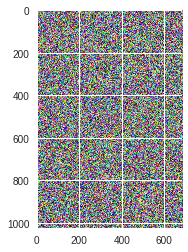

In [10]:
def rand_img(shape):
    return np.random.random(shape) * 20 + 128

x = rand_img(shp)
plt.imshow(x[0])
imageio.imwrite('results/res_at_iteration_0.png', x[0])
x = vgg16.preprocess_input(x)



## Content Reconstructions

In [0]:

class Evaluator(object):
    def __init__(self, f, shp): self.f, self.shp = f, shp
        
    def loss(self, x):
        loss_, self.grad_values = self.f([x.reshape(self.shp)])
        return loss_.astype(np.float64)

    def grads(self, x): return self.grad_values.flatten().astype(np.float64)
    

    
def solve_image(evaluator, iterations, x):
    for i in range(iterations):
        print('Start of iteration', i+1)
        start_time = time.time()
        x, min_val, info = fmin_l_bfgs_b(evaluator.loss, x.flatten(),
                                         fprime=evaluator.grads, maxfun=20)
        x = np.clip(x, -127,127)
        print('Current loss value:', min_val)
        img = x.reshape((img_height, img_width, 3))
        img = deprocess_image(img)
        imageio.imwrite(f'results/res_at_iteration_{i+1}.png', img)
        end_time = time.time()
        print(f'Iteration {i+1} completed in {int(end_time - start_time)}s')
    return x    

In [0]:
content_layer_name = 'block4_conv2'

content_layer = model.get_layer(content_layer_name).output
content_model = Model(model.input, content_layer)
targ = K.constant(content_model.predict(content_img_arr))

In [0]:
content_loss = K.sum(K.square(content_layer - targ)) / 2

grads = K.gradients(content_loss, content_model.input)
fn = K.function([content_model.input], [content_loss]+grads)
evaluator = Evaluator(fn, shp)

In [14]:
iterations=10

x = solve_image(evaluator, iterations, x)



Start of iteration 1
Current loss value: 20243384320.0
Iteration 1 completed in 19s
Start of iteration 2
Current loss value: 9319874560.0
Iteration 2 completed in 16s
Start of iteration 3
Current loss value: 5772075008.0
Iteration 3 completed in 17s
Start of iteration 4
Current loss value: 4230504960.0
Iteration 4 completed in 16s
Start of iteration 5
Current loss value: 3441619200.0
Iteration 5 completed in 16s
Start of iteration 6
Current loss value: 2938555136.0
Iteration 6 completed in 16s
Start of iteration 7
Current loss value: 2609480704.0
Iteration 7 completed in 17s
Start of iteration 8
Current loss value: 2364024064.0
Iteration 8 completed in 16s
Start of iteration 9
Current loss value: 2160681216.0
Iteration 9 completed in 17s
Start of iteration 10
Current loss value: 1993139456.0
Iteration 10 completed in 17s


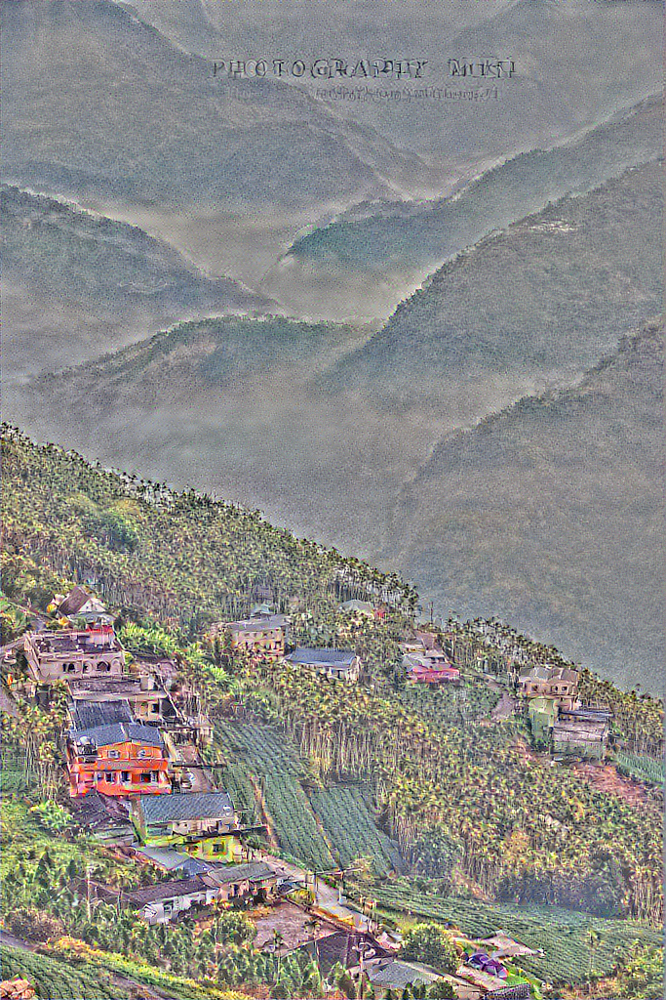

In [15]:
load_img(f'results/res_at_iteration_{iterations}.png')

In [0]:
def plot_images_labels(images, labels, height=15, idx=0, num=10):
    fig = plt.gcf()
    fig.set_size_inches(height, height*img_width // img_height)
    if num > 20: num = 20 
    for i in range(0, num):
        ax=plt.subplot(5, 3, i+1)
        ax.imshow(images[idx], cmap='binary')

        ax.set_title(f'{str(labels[idx])}', fontsize=10) 
        
        ax.set_xticks([]);ax.set_yticks([])        
        idx+=1 
    plt.show()

In [0]:
images = []
labels = []
for i in range(iterations+1):
    img = load_img(f'results/res_at_iteration_{i}.png')
    images.append(np.array(img))
    labels.append(f'iteration_{i}')

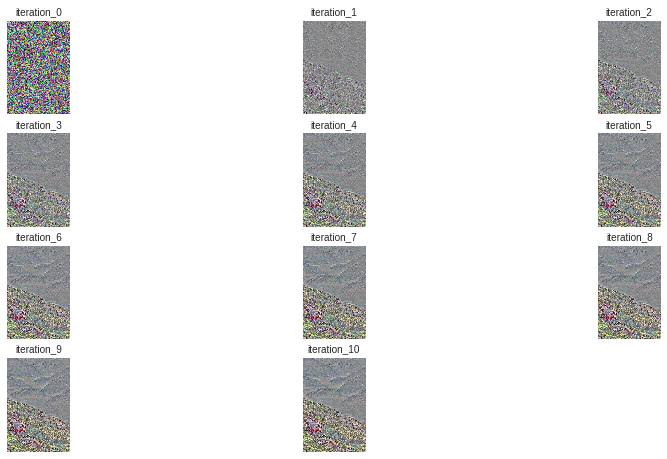

In [18]:
plot_images_labels(images, labels, num=iterations+1)


## Style Reconstructions

In [0]:
def gram_matrix(x):
    features = K.batch_flatten(K.permute_dimensions(x, (2, 0, 1)))
    gram = K.dot(features, K.transpose(features))
    return gram


def one_layer_style_loss(x, targ):
    S = gram_matrix(targ)
    C = gram_matrix(x)
    channels = 3
    size = img_height * img_width
    return K.sum(K.square(S - C)) / (4. * (channels ** 2) * (size ** 2))

In [0]:
# Dict mapping layer names to activation tensors
outputs_dict = dict([(layer.name, layer.output) for layer in model.layers])
# Name of layers used for style loss
style_layer_names = ['block1_conv1',
                     'block2_conv1',
                     'block3_conv1',
                     'block4_conv1',
                     'block5_conv1']

style_layers = [outputs_dict[l_name] for l_name in style_layer_names]

In [0]:
style_model = Model(model.input, style_layers)
targs = [K.constant(o) for o in style_model.predict(style_image_arr)]

In [0]:
style_loss = sum(one_layer_style_loss(l1[0], l2[0]) for l1,l2 in zip(style_layers, targs))
style_grads = K.gradients(style_loss, style_model.input)
style_fn = K.function([style_model.input], [style_loss]+style_grads)
style_evaluator = Evaluator(style_fn, shp)

In [0]:
x = rand_img(shp)
x = vgg16.preprocess_input(x)

In [24]:
iterations=10

x = solve_image(style_evaluator, iterations, x)



Start of iteration 1
Current loss value: 6622638080.0
Iteration 1 completed in 36s
Start of iteration 2
Current loss value: 1617727744.0
Iteration 2 completed in 22s
Start of iteration 3
Current loss value: 819393664.0
Iteration 3 completed in 22s
Start of iteration 4
Current loss value: 522050752.0
Iteration 4 completed in 22s
Start of iteration 5
Current loss value: 351825664.0
Iteration 5 completed in 22s
Start of iteration 6
Current loss value: 237581520.0
Iteration 6 completed in 22s
Start of iteration 7
Current loss value: 161770208.0
Iteration 7 completed in 22s
Start of iteration 8
Current loss value: 114915512.0
Iteration 8 completed in 22s
Start of iteration 9
Current loss value: 83407312.0
Iteration 9 completed in 22s
Start of iteration 10
Current loss value: 60769108.0
Iteration 10 completed in 22s


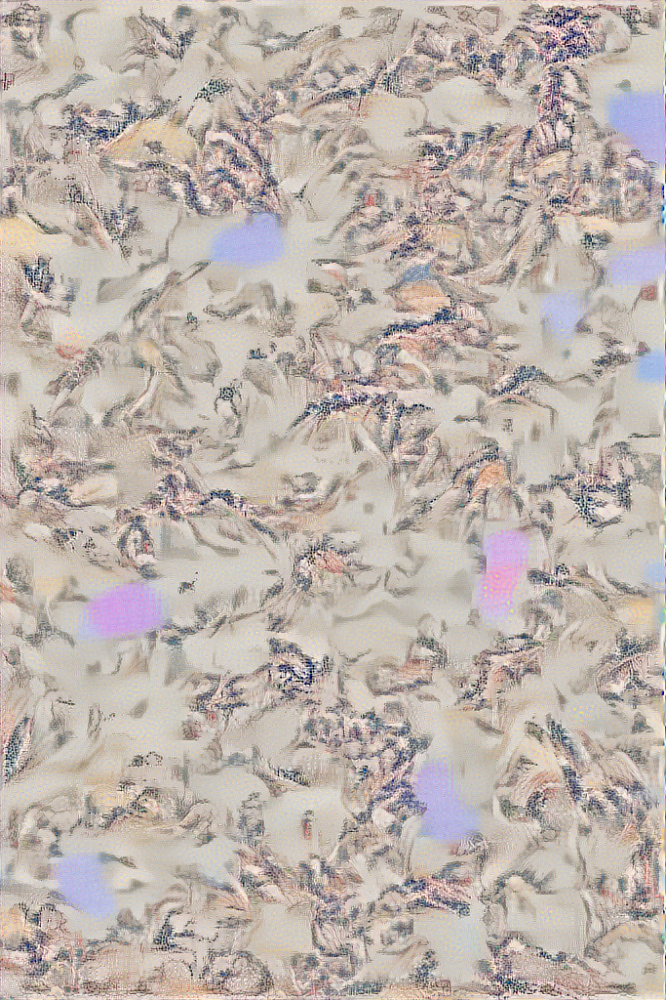

In [25]:
load_img(f'results/res_at_iteration_{iterations}.png')

$\alpha, \beta, \gamma$

In [26]:
iterations=10
alpha, beta = 0.2, 1. 

transfer_loss = alpha * (K.sum(K.square(content_layer - targ)) / 2)
transfer_loss += beta * (sum(one_layer_style_loss(l1[0], l2[0]) for l1,l2 in zip(style_layers, targs)))

transfer_grads = K.gradients(transfer_loss, model.input)
transfer_fn = K.function([model.input], [transfer_loss]+transfer_grads)

transfer_evaluator = Evaluator(transfer_fn, shp)

x = rand_img(shp)
x = vgg16.preprocess_input(x)

solve_image(transfer_evaluator, iterations, x)

Start of iteration 1
Current loss value: 11082746880.0
Iteration 1 completed in 35s
Start of iteration 2
Current loss value: 5604174336.0
Iteration 2 completed in 22s
Start of iteration 3
Current loss value: 4210009856.0
Iteration 3 completed in 22s
Start of iteration 4
Current loss value: 3592376576.0
Iteration 4 completed in 22s
Start of iteration 5
Current loss value: 3255491328.0
Iteration 5 completed in 22s
Start of iteration 6
Current loss value: 3045587968.0
Iteration 6 completed in 22s
Start of iteration 7
Current loss value: 2896534528.0
Iteration 7 completed in 22s
Start of iteration 8
Current loss value: 2796539392.0
Iteration 8 completed in 22s
Start of iteration 9
Current loss value: 2704721664.0
Iteration 9 completed in 22s
Start of iteration 10
Current loss value: 2631806464.0
Iteration 10 completed in 22s


array([35.30766908, -4.20197572, -4.21930324, ..., 55.37799131,
       30.62605461, 45.99000583])

alpha, beta = 0.2, 1.


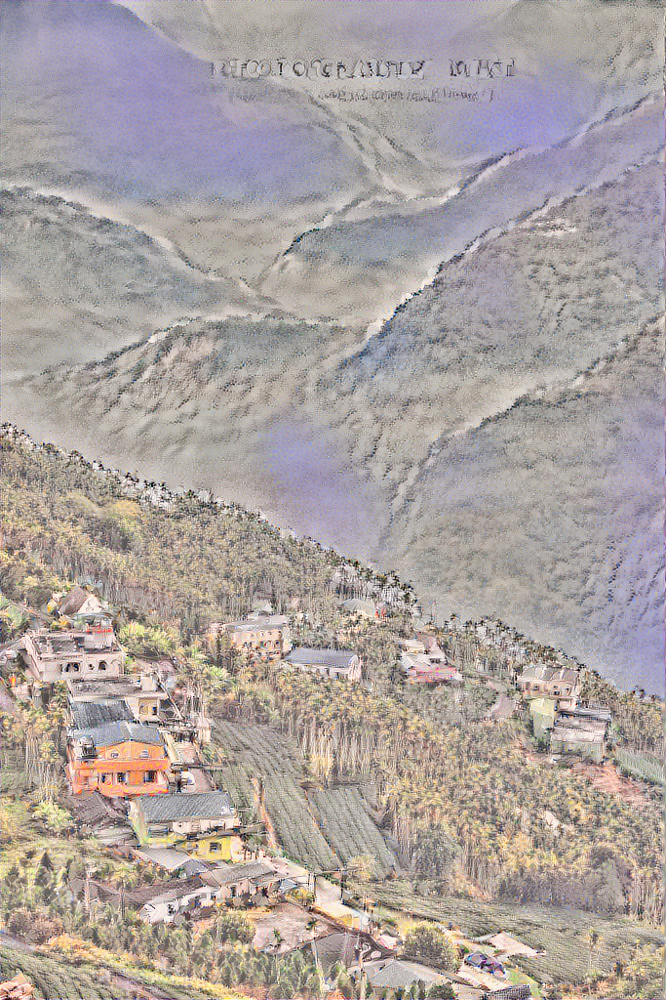

In [27]:
print('alpha, beta = 0.2, 1.')
load_img(f'results/res_at_iteration_{iterations}.png')

In [0]:
def generate_transfer_img(alpha=0.5, beta=1., iterations=10):

    transfer_loss = alpha * (K.sum(K.square(content_layer - targ)) / 2)
    transfer_loss += beta * (sum(one_layer_style_loss(l1[0], l2[0]) for l1,l2 in zip(style_layers, targs)))

    transfer_grads = K.gradients(transfer_loss, model.input)
    transfer_fn = K.function([model.input], [transfer_loss]+transfer_grads)

    transfer_evaluator = Evaluator(transfer_fn, shp)

    x = rand_img(shp)
    x = vgg16.preprocess_input(x)

    solve_image(transfer_evaluator, iterations, x)
    
    return iterations    

In [29]:
img_index = generate_transfer_img(0.4, 1, 10)

Start of iteration 1
Current loss value: 16250642432.0
Iteration 1 completed in 35s
Start of iteration 2
Current loss value: 8615053312.0
Iteration 2 completed in 22s
Start of iteration 3
Current loss value: 6554349568.0
Iteration 3 completed in 22s
Start of iteration 4
Current loss value: 5624140800.0
Iteration 4 completed in 22s
Start of iteration 5
Current loss value: 5105851392.0
Iteration 5 completed in 22s
Start of iteration 6
Current loss value: 4772836352.0
Iteration 6 completed in 22s
Start of iteration 7
Current loss value: 4537473536.0
Iteration 7 completed in 22s
Start of iteration 8
Current loss value: 4358087680.0
Iteration 8 completed in 22s
Start of iteration 9
Current loss value: 4222662144.0
Iteration 9 completed in 22s
Start of iteration 10
Current loss value: 4094286848.0
Iteration 10 completed in 22s


alpha, beta = 0.4, 1.


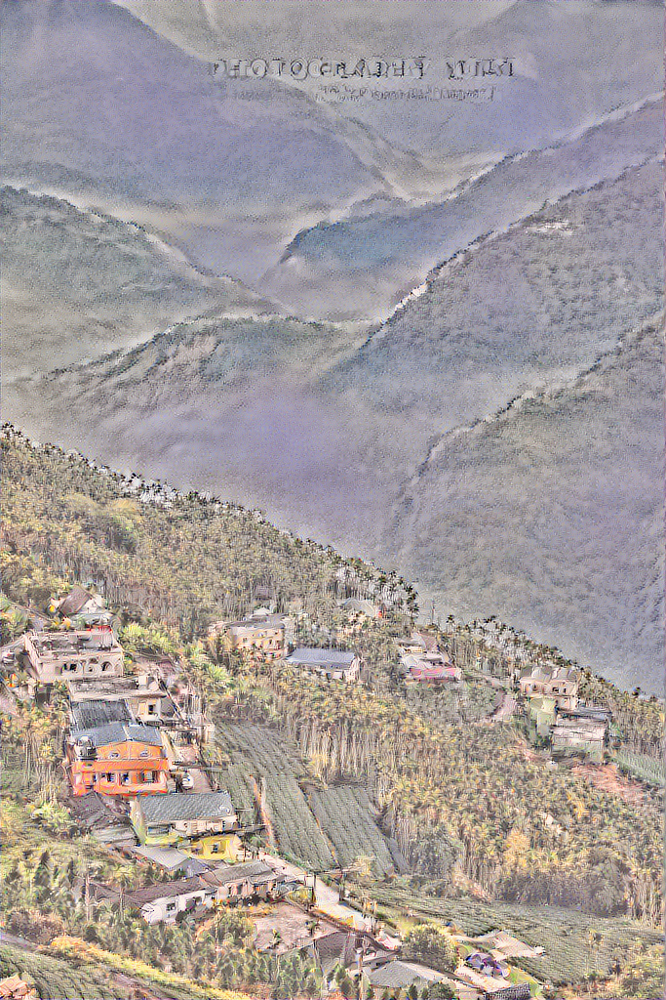

In [30]:
print('alpha, beta = 0.4, 1.')
load_img(f'results/res_at_iteration_{img_index}.png')

In [0]:
img_index = generate_transfer_img(0.6, 1, 10)

Start of iteration 1
Current loss value: 21261017088.0
Iteration 1 completed in 35s
Start of iteration 2
Current loss value: 11401287680.0
Iteration 2 completed in 22s
Start of iteration 3
Current loss value: 8532564992.0
Iteration 3 completed in 22s
Start of iteration 4
Current loss value: 7267922944.0
Iteration 4 completed in 22s
Start of iteration 5
Current loss value: 6556991488.0
Iteration 5 completed in 22s
Start of iteration 6
Current loss value: 6106719744.0
Iteration 6 completed in 22s
Start of iteration 7


alpha, beta = 0.6, 1.


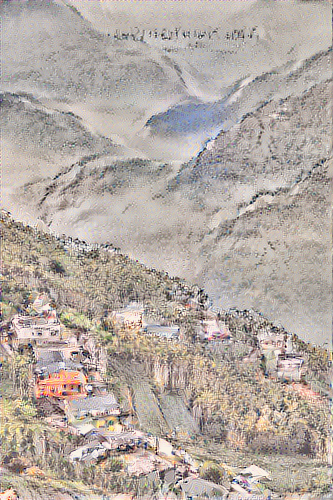

In [31]:
print('alpha, beta = 0.6, 1.')
load_img(f'results/res_at_iteration_{img_index}.png')